## Initial setup

In [1]:
#@title Install the required libs
!pip install -qq diffusers==0.16.1 transformers ftfy accelerate


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 89.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.4 MB/s eta 0:00:00


In [2]:
#@title Login to the Hugging Face Hub
from huggingface_hub import notebook_login

notebook_login()

In [3]:
#@title Import required libraries
import os
import torch

import PIL
from PIL import Image

from diffusers import StableDiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Run Stable Diffusion with pre-trained Learned Concepts
If you want to teach Stable Diffusion your own concepts, [use this notebook](#).



In [4]:
#@markdown `pretrained_model_name_or_path` which Stable Diffusion checkpoint you want to use. This should match the one used for training the embeddings.
pretrained_model_name_or_path = "stabilityai/stable-diffusion-2" #@param {type:"string"}

In [5]:
#@title Load your concept here
#@markdown Enter the `repo_id` for a concept you like (you can find pre-learned concepts in the public [SD Concepts Library](https://huggingface.co/sd-concepts-library))
repo_id_embeds = "sd-concepts-library/ralph-lauren-2023-c" #@param {type:"string"}

In [6]:
#@title Load the Stable Diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16
).to("cuda")

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [7]:
#@title Load the concept into pipeline
pipe.load_textual_inversion(repo_id_embeds)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

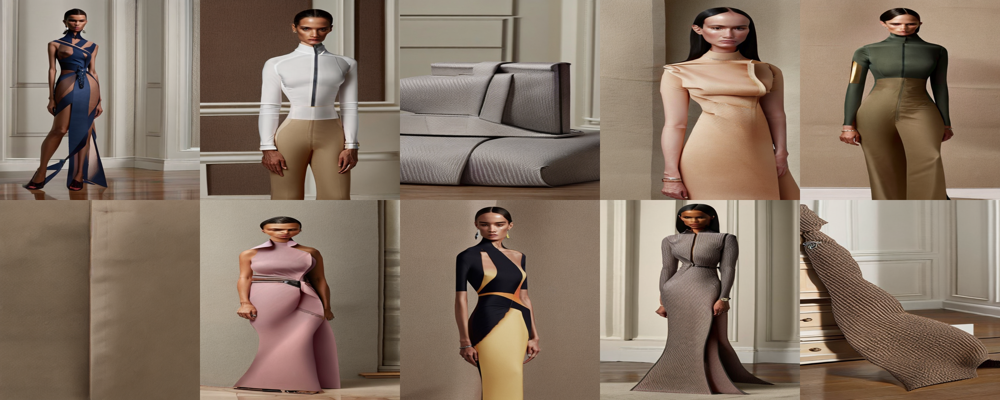

In [8]:
#@title Run the Stable Diffusion pipeline
#@markdown Don't forget to use the placeholder token in your prompt

prompt = "a \u003Cralph-lauren-2023> model wearing a \u003Cralph-lauren-2023> in the style of \u003Cralph-lauren-2023>" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 5 #@param {type:"number"}
num_inference_steps = 200 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(
        prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=7.5,
    ).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

In [ ]:
# https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/img2img

In [9]:
from diffusers import StableDiffusionImg2ImgPipeline


#@title Load the Stable Diffusion pipeline
image_to_image_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16,
  ).to("cuda")




In [10]:
image_to_image_pipe.load_textual_inversion(repo_id_embeds)

In [26]:
import requests
from PIL import Image
from io import BytesIO

prompt = "a \u003Cralph-lauren-2023> outfit" #@param {type:"string"}

url = "https://imgs.search.brave.com/Lt-xEq1V20zsUrhAJTmU9eqpIbMYmPDlvo0n4QCJsAA/rs:fit:860:0:0/g:ce/aHR0cHM6Ly9pbWFn/ZXMudW5zcGxhc2gu/Y29tL3Bob3RvLTE2/MjEwNjIwODk0NjEt/MDFmMWVhZWJiNjZj/P2l4bGliPXJiLTQu/MC4zJml4aWQ9TTN3/eE1qQTNmREI4TUh4/elpXRnlZMmg4TVRa/OGZHMWxiaVV5TUhO/MWFYUjhaVzU4TUh4/OE1IeDhmREE9Jnc9/MTAwMCZxPTgw" #@param {type:"string"}
response = requests.get(url)
init_image = Image.open(BytesIO(response.content)).convert("RGB")
init_image = init_image.resize((768, 512))


num_cols = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}
num_inference_steps = 100 #@param {type:"number"}
strength = 0.3 #@param {type:"number"}
guidance_scale = 3 #@param {type:"number"}


display(init_image)

all_images = []
for _ in range(num_rows * num_cols):
    images = image_to_image_pipe(
        prompt=prompt,
        image=init_image,
        strength=strength,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    ).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_cols)
grid